# 02 • Compare native CosMx and stitched RGB segmentation
Read completed caches; no Cellpose inference or original FOV loading is required.
Comparisons are matched by tile, using the same coverage and core region for each method.

**Important:** native CosMx masks are the reference, not an independently annotated truth set.
The columns called precision/recall/F1 are **agreement with native CosMx**, not demonstrated
biological accuracy. Old FOV-edge splits in the reference can penalize a genuinely improved
cross-border candidate.

In [1]:
from pathlib import Path
import sys
import importlib
import numpy as np
import pandas as pd

# Keep this notebook, pilot_config.json and cosmx_rgb_pilot.py together.
HERE = Path.cwd()
if not (HERE / "cosmx_rgb_pilot.py").exists():
    raise FileNotFoundError("Set HERE to the extracted notebook bundle directory.")
if str(HERE) not in sys.path:
    sys.path.insert(0, str(HERE))
import cosmx_rgb_pilot as pilot
importlib.reload(pilot)
CONFIG_PATH = HERE / "pilot_config.json"
config = pilot.read_json(CONFIG_PATH)
OUTPUT_ROOT = Path(config["output_root"])
for sample_spec in config["samples"].values():
    source_path = Path(sample_spec["source_zarr"]).resolve()
    output_path = OUTPUT_ROOT.resolve()
    if output_path == source_path or source_path in output_path.parents or output_path in source_path.parents:
        raise ValueError("The pilot output root must be separate from every source Zarr.")
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
print("Output root:", OUTPUT_ROOT)

Output root: /host_root/nethome/reny28/Projects/CosMX_projects/P06364_CRC_DS20250227_48371/tmp/DS-20250227-48371/cpsam_v2_rgb_softstitch_pilot_v1


### 1. Compute geometry, transcript and agreement summaries
Regions are the observed core, a ±`border_band_um` band around *shared old FOV borders*, and
the remaining core interior. There are no missing-tile pixels in the denominator. Change the
band to 100 µm for your historical exclusion scale, but inspect the remaining interior area.

Object matching uses maximum-cardinality one-to-one matching at IoU ≥0.5 on masks clipped to
the evaluation region. Therefore seam-band object metrics concern **clipped regions**, not
full-cell detection. Whole-mask areas/counts are separately summarized for cells whose centroids
are in the region. Halo cells remain available as context but are not counted as core-owned cells.

`nCount_RNA` and `nFeature_RNA` use non-control features only, consistently across methods;
control counts are reported separately. RNA assignment uses containment in candidate masks,
except optional Proseg methods, which use its ID-joined transcript assignments. ARI excludes
unassigned transcripts and is always paired with assignment-coverage metrics to avoid a large
shared background cluster dominating the result.

In [2]:
metrics, cell_metrics = pilot.compare_all(config)
display(metrics.head(20))
display(metrics[["sample", "tile_id", "method", "region", "observed_area_um2", "n_cells_centroid",
                 "median_area_um2", "median_nCount_RNA", "median_nFeature_RNA", "assigned_fraction",
                 "object_f1_vs_native", "ari_jointly_assigned"]])

,sample,tile_id,method,region,border_band_um,observed_area_um2,n_cells_centroid,cells_per_mm2,median_area_um2,median_nCount_RNA,...,object_recall_vs_native,object_f1_vs_native,split_native_fraction,merged_candidate_fraction,n_transcripts_evaluated,assigned_fraction,native_assigned_fraction,jointly_assigned_fraction,native_fg_recovery,ari_jointly_assigned
0,B20317610105_colon,pilot_00_vertical_seam,native,core,50.0,60680.163662,349,5751.467678,79.222817,324.0,...,1.000000,1.000000,0.000000,0.000000,185182,0.826700,0.826700,0.826700,1.000000,1.000000
1,B20317610105_colon,pilot_00_vertical_seam,native,old_border_band,50.0,24651.316488,147,5963.170368,78.499453,281.0,...,1.000000,1.000000,0.000000,0.000000,74050,0.835111,0.835111,0.835111,1.000000,1.000000
2,B20317610105_colon,pilot_00_vertical_seam,native,interior,50.0,36028.847174,202,5606.618469,79.852143,355.0,...,1.000000,1.000000,0.000000,0.000000,111132,0.821096,0.821096,0.821096,1.000000,1.000000
3,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,core,50.0,60680.163662,448,7382.972836,30.656163,159.5,...,0.270619,0.240550,0.265464,0.158763,185182,0.598055,0.826700,0.580478,0.702162,0.749381
4,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,old_border_band,50.0,24651.316488,196,7950.893823,31.683340,141.5,...,0.300578,0.265985,0.283237,0.169725,74050,0.640986,0.835111,0.624402,0.747688,0.764254
5,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,interior,50.0,36028.847174,252,6994.395318,30.634462,185.0,...,0.252000,0.231618,0.236000,0.146259,111132,0.569449,0.821096,0.551209,0.671310,0.754742
6,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_balanced,core,50.0,60680.163662,410,6756.738533,24.919887,135.0,...,0.139175,0.130120,0.177835,0.099548,185182,0.475905,0.826700,0.465942,0.563616,0.805274
7,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_balanced,old_border_band,50.0,24651.316488,177,7180.143912,23.986748,112.0,...,0.150289,0.142077,0.184971,0.129534,74050,0.513315,0.835111,0.504308,0.603881,0.773414
8,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_balanced,interior,50.0,36028.847174,233,6467.040116,25.187532,145.0,...,0.124000,0.119461,0.160000,0.074349,111132,0.450977,0.821096,0.440377,0.536329,0.853932
9,B20317610105_colon,pilot_00_vertical_seam,rgb_v2_independent_fovs,core,50.0,60680.163662,518,8536.562342,29.882164,148.5,...,0.301546,0.246057,0.337629,0.138544,185182,0.635267,0.826700,0.613964,0.742668,0.738987


,sample,tile_id,method,region,observed_area_um2,n_cells_centroid,median_area_um2,median_nCount_RNA,median_nFeature_RNA,assigned_fraction,object_f1_vs_native,ari_jointly_assigned
0,B20317610105_colon,pilot_00_vertical_seam,native,core,60680.163662,349,79.222817,324.0,146.0,0.826700,1.000000,1.000000
1,B20317610105_colon,pilot_00_vertical_seam,native,old_border_band,24651.316488,147,78.499453,281.0,130.0,0.835111,1.000000,1.000000
2,B20317610105_colon,pilot_00_vertical_seam,native,interior,36028.847174,202,79.852143,355.0,156.0,0.821096,1.000000,1.000000
3,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,core,60680.163662,448,30.656163,159.5,89.0,0.598055,0.240550,0.749381
4,B20317610105_colon,pilot_00_vertical_seam,blue_v2_legacy_thresholds,old_border_band,24651.316488,196,31.683340,141.5,82.5,0.640986,0.265985,0.764254
...,...,...,...,...,...,...,...,...,...,...,...,...
94,B20971880114_colon,pilot_03_dense_interior,rgb_v2_balanced,old_border_band,0.000000,0,NaN,NaN,NaN,NaN,NaN,NaN
95,B20971880114_colon,pilot_03_dense_interior,rgb_v2_balanced,interior,60680.163662,412,79.475994,716.0,262.5,0.739346,0.610925,0.788849
96,B20971880114_colon,pilot_03_dense_interior,rgb_v2_legacy_thresholds,core,60680.163662,561,74.144802,622.0,238.0,0.912387,0.633962,0.721885
97,B20971880114_colon,pilot_03_dense_interior,rgb_v2_legacy_thresholds,old_border_band,0.000000,0,NaN,NaN,NaN,NaN,NaN,NaN


### 2. Paired tile comparisons
Every line is one pilot tile. Do not treat hundreds of thousands of cells as independent
biological replicates. With two samples and a small pilot panel, these are descriptive tests.
For calibration plots, retain sparse and dense tiles; do not select solely by highest native F1.

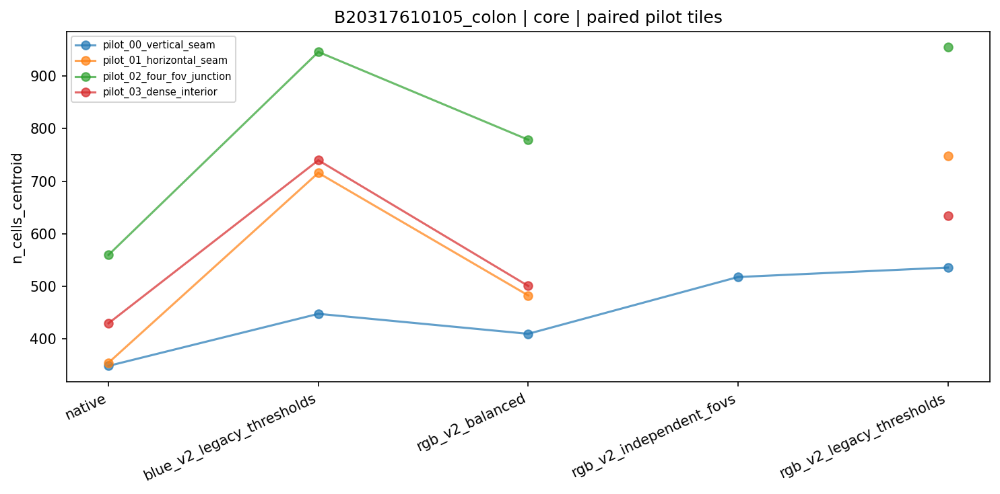

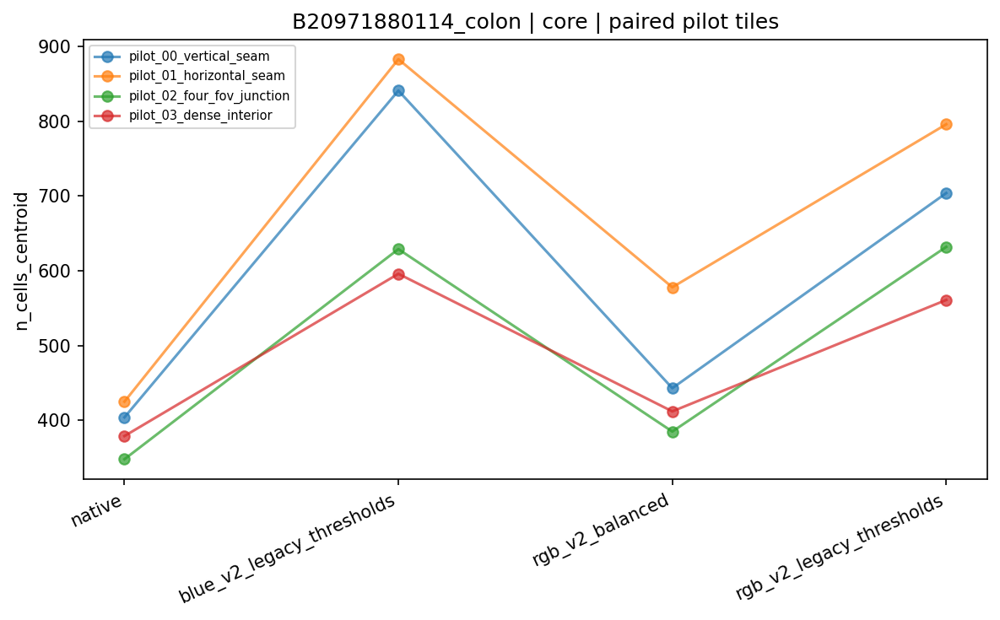

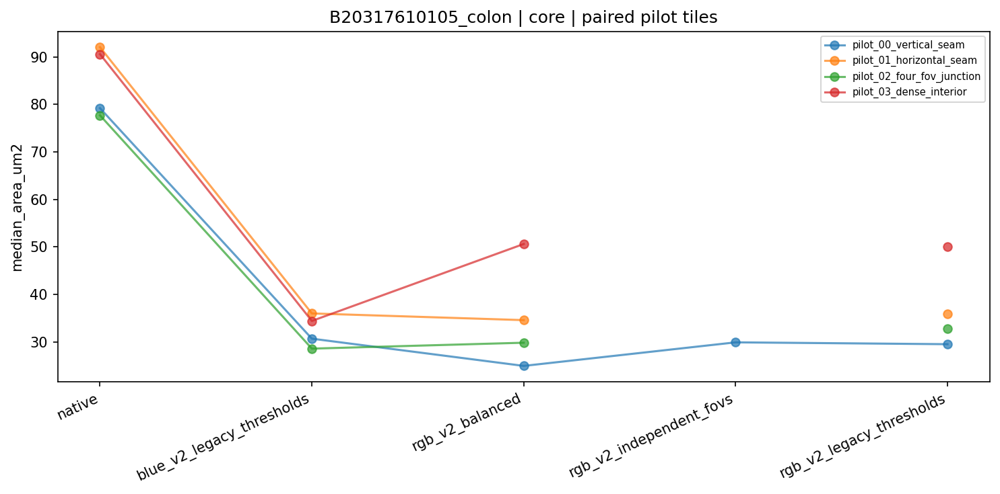

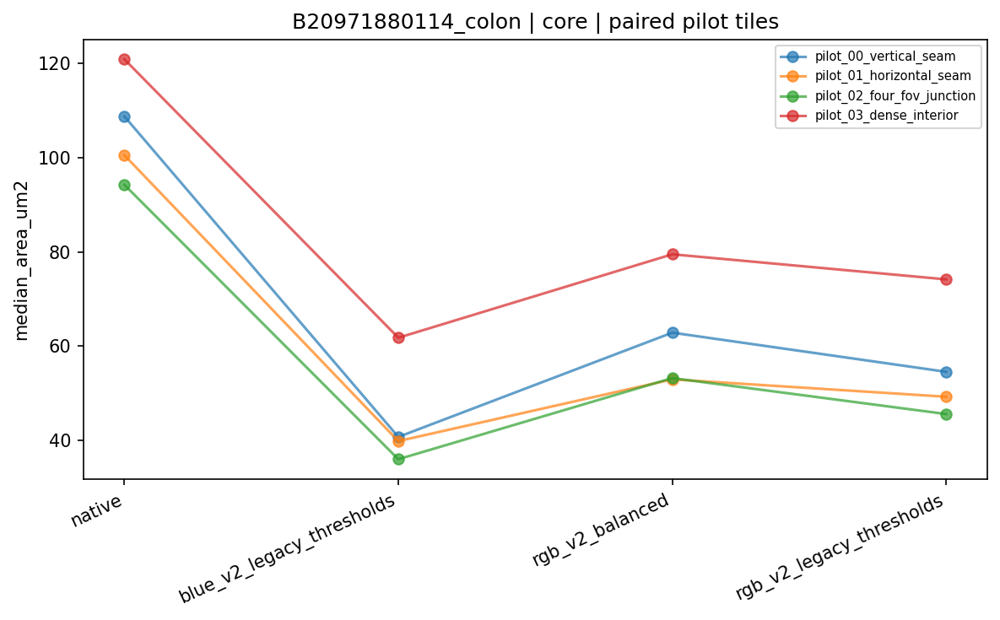

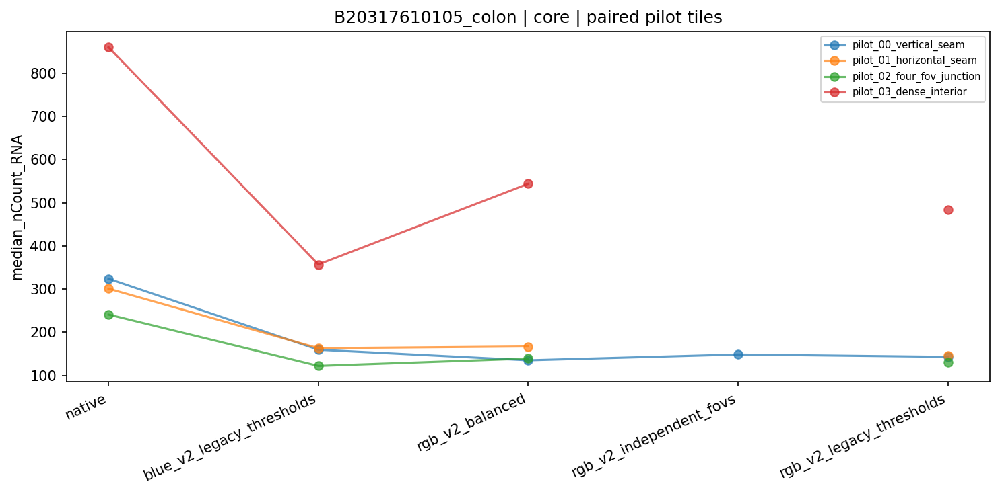

...

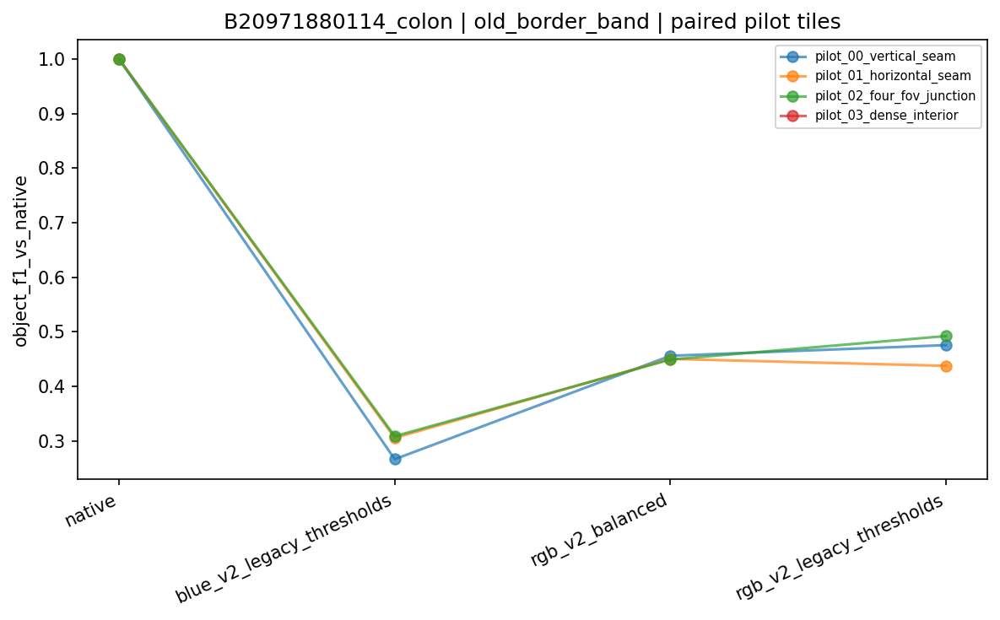

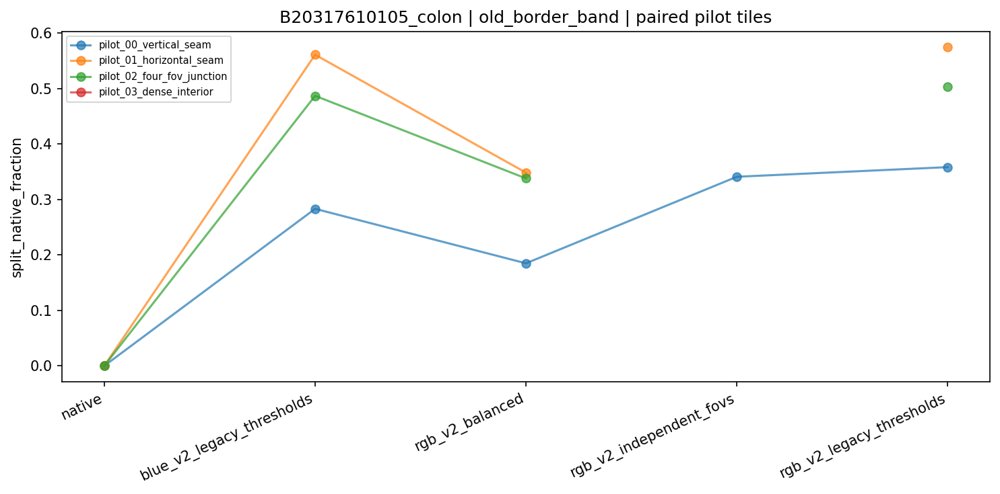

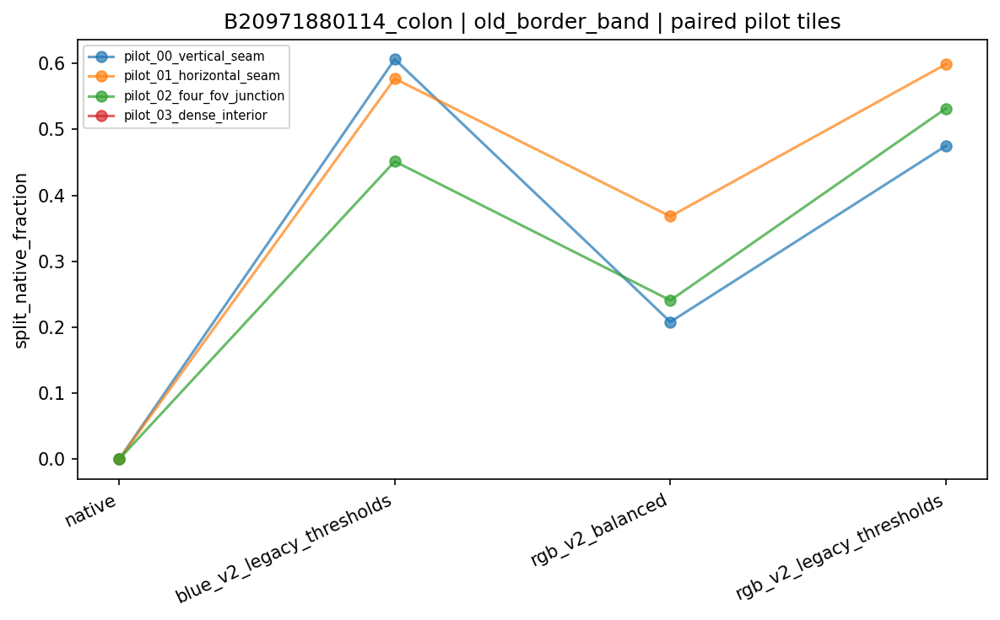

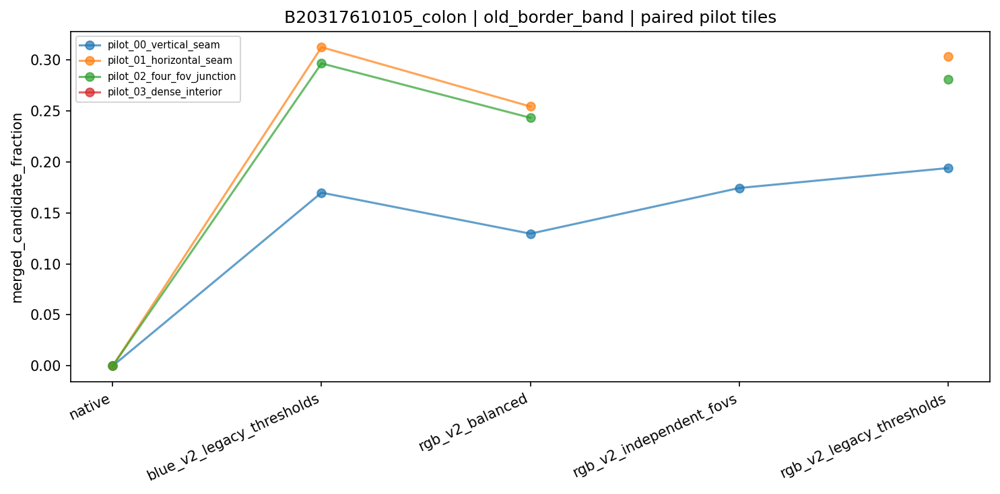

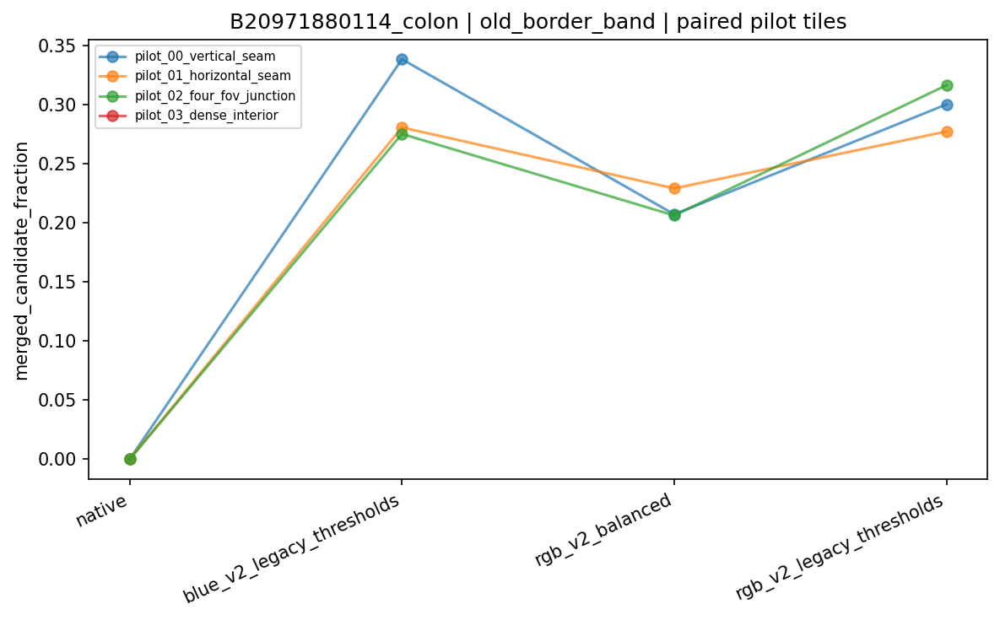

In [3]:
for metric in ["n_cells_centroid", "median_area_um2", "median_nCount_RNA", "median_nFeature_RNA", "assigned_fraction"]:
    pilot.plot_comparison(metrics, metric, region="core")
for metric in ["cross_fov_cell_fraction", "object_f1_vs_native", "split_native_fraction", "merged_candidate_fraction"]:
    pilot.plot_comparison(metrics, metric, region="old_border_band")

### 3. Matched boundary views and close-ups
Each method receives its own figure and identical crop coordinates. Solid fine contours are
cell boundaries; dashed outlines show the retained core and FOV ownership transitions.
Use `show_points=True` sparingly at high transcript density.

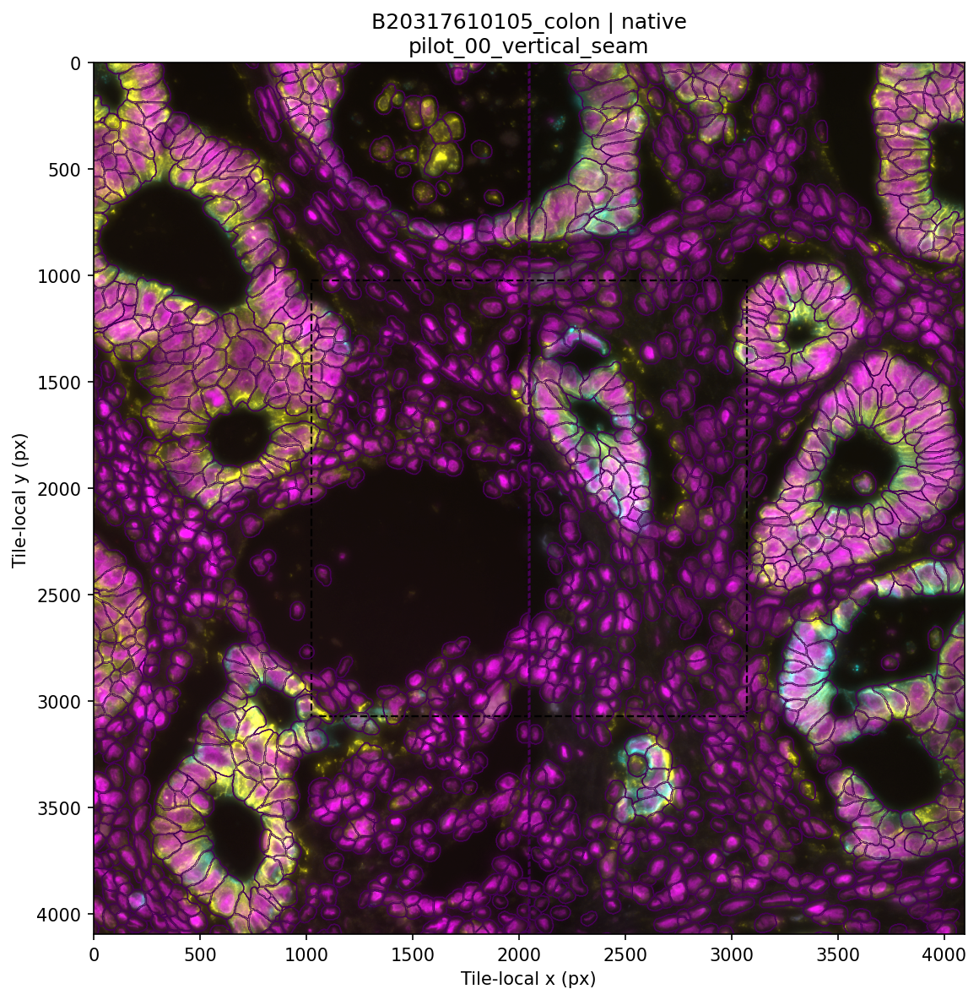

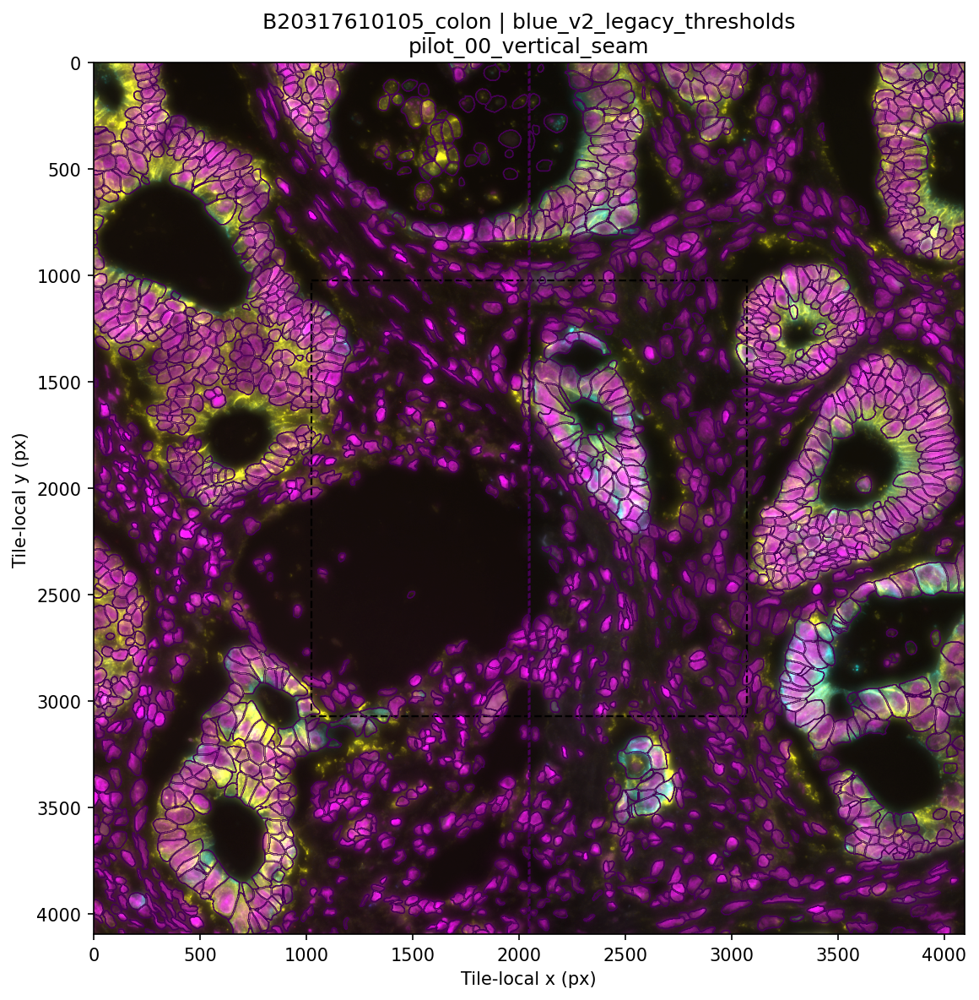

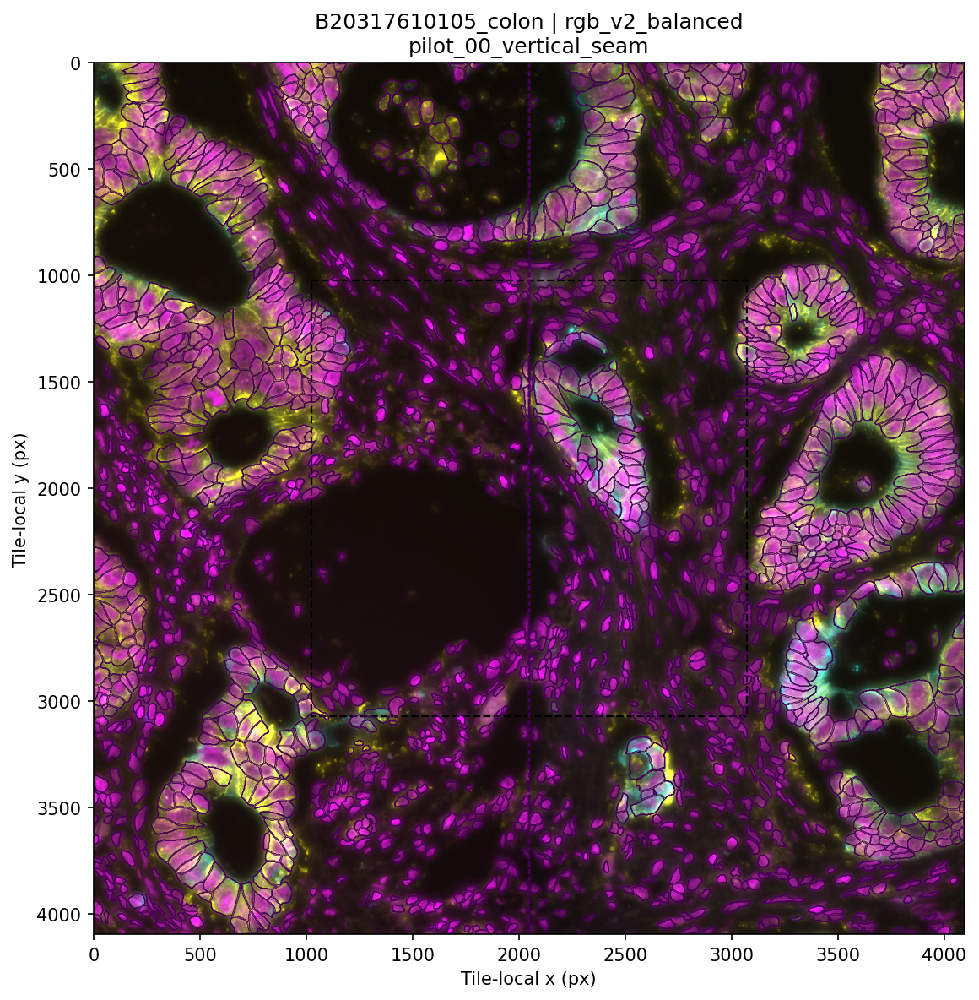

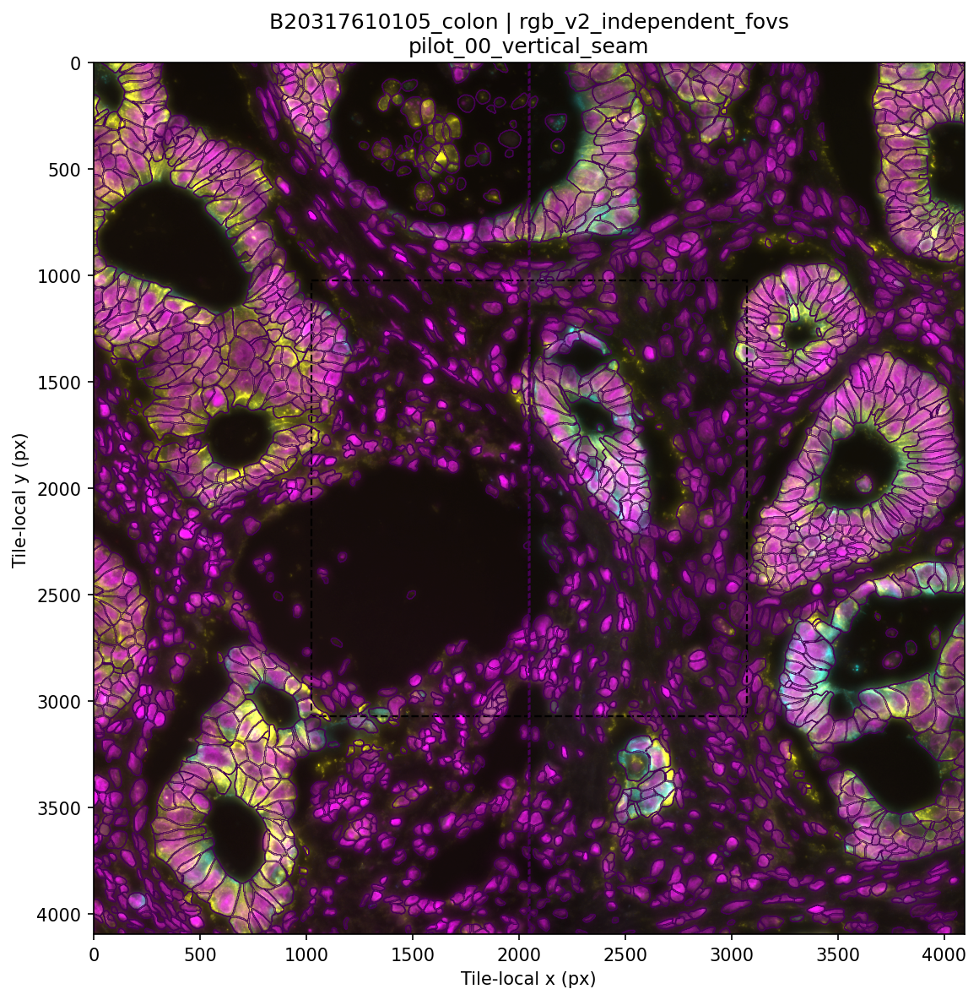

In [ ]:
SAMPLE_TO_VIEW = "B20317610105_colon"
tile_paths = sorted(p.parent for p in (OUTPUT_ROOT / SAMPLE_TO_VIEW / "tiles").glob("*/complete.json"))
if not tile_paths:
    raise RuntimeError("No prepared pilot tiles for the selected sample.")
TILE_TO_VIEW = tile_paths[0]
CROP = None  # Example tile-local ROI: (1400, 1400, 2400, 2400)
methods = ["native"] + sorted(p.parent.name for p in (TILE_TO_VIEW / "methods").glob("*/complete.json"))
for method in methods:
    pilot.plot_tile(TILE_TO_VIEW, method, crop=CROP)

### 4. Optional self-contained pilot SpatialData export
The export has one `rgb` image, one `cell_labels` label element, one transcript layer and one
canonical `table` linked to `cell_labels`. Newly added `.obs` annotations can therefore be
rendered without synchronizing a separate `table_labels` copy. Cell IDs are explicit and the
index name is `obs_id`, avoiding the earlier pandas index-name collision.

The writer only writes to a **new** path, tests a reload, then publishes it. It never invokes
the old `persist_changes()` helper, changes existing root format metadata, copies raw element
folders, or patches Dask. A failed export leaves a `.partial-*` output for inspection and does
not affect the completed comparison files. This optional step has not been tested on your
exact SpatialData/OME-Zarr dependency combination; start with one pilot window.

All halo cells are retained with `in_core` metadata for inspection. Overlapping pilot exports
are not a deduplicated whole-sample assembly and should not be concatenated as one sample.

In [ ]:
EXPORT_ONE_PILOT_ZARR = False
if EXPORT_ONE_PILOT_ZARR:
    method = "rgb_v2_legacy_thresholds"
    destination = OUTPUT_ROOT / "pilot_exports" / f"{SAMPLE_TO_VIEW}_{TILE_TO_VIEW.name}_{method}.zarr"
    destination.parent.mkdir(parents=True, exist_ok=True)
    exported = pilot.export_tile_spatialdata(TILE_TO_VIEW, method, destination)
    print(exported)
    import spatialdata_plot  # register .pl accessor
    plot = exported.pl.render_images("rgb").pl.render_labels(
        "cell_labels", color="Area.um2", table_name="table", fill_alpha=0.35,
    )
    plot.pl.show(coordinate_systems=["tile"], title="Pilot cells colored by area", colorbar=True)
else:
    print("Pilot Zarr export disabled; comparison CSV/Parquet files are already saved.")

### What supports proceeding to larger stitched regions?
Look for credible morphology on both sides of old borders, preservation of small cells and
elongated cells, sensible transcript/gene counts, and fewer artificial border splits without
new obvious multiplets. Review lower-agreement seam regions, not only the best-looking fields.

The saved `comparison/all_tile_metrics.csv` and `comparison/all_cell_metrics.parquet` can be
reopened after a kernel restart. Use independent held-out windows before locking parameters.
Boundary reconciliation and globally unique final-cell ownership remain a subsequent
production-assembly step; this package establishes the RGB model comparison first.

Sources: [SciPy one-to-one matching](https://docs.scipy.org/doc/scipy/reference/generated/scipy.sparse.csgraph.maximum_bipartite_matching.html),
[SpatialData annotation linkage](https://spatialdata.scverse.org/en/stable/api/models.html).